# 阈值分割

In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def show(img):
    if img.ndim == 2:
        plt.imshow(img, cmap='gray')
    else:
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        plt.imshow(img)
    plt.show()

## 1.直方图阈值
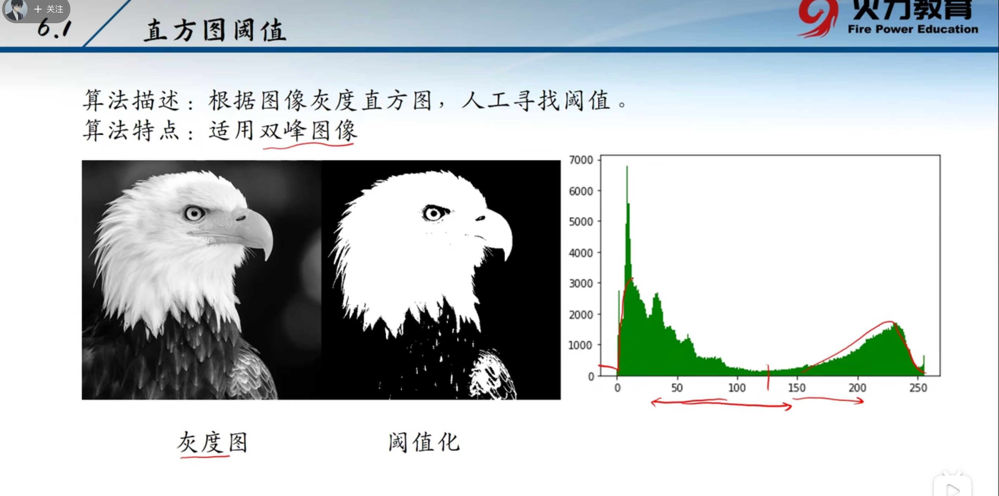

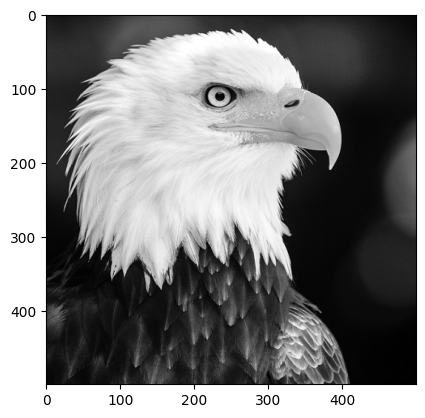

In [3]:
img = cv.imread('pic/eagle500x500.jpg', 0)
show(img)

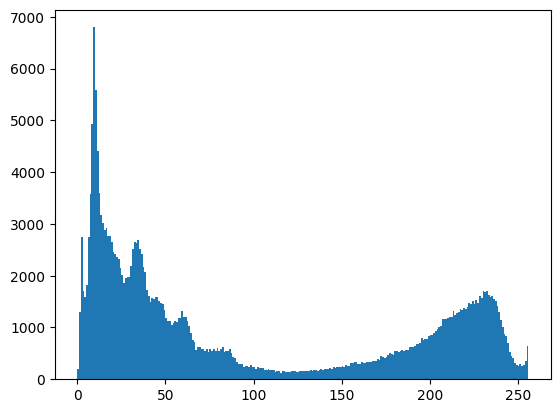

In [4]:
#方法1 img.ravel()函数
plt.hist(img.ravel(),256,[0,256]) #img.ravel()把图像拉平，从二维变为一维
plt.show()

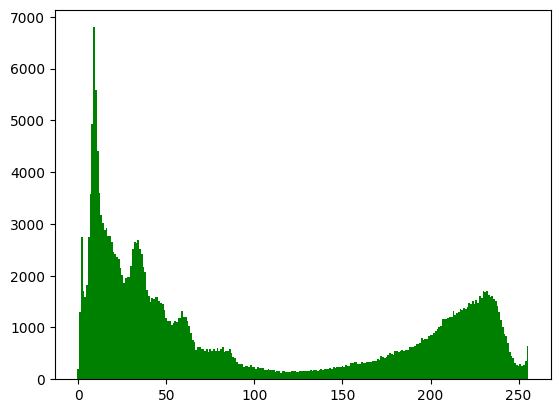

In [5]:
#方法2 flatten()函数
plt.hist(img.flatten(),np.arange(-0.5,256,1),color="g")
plt.show()

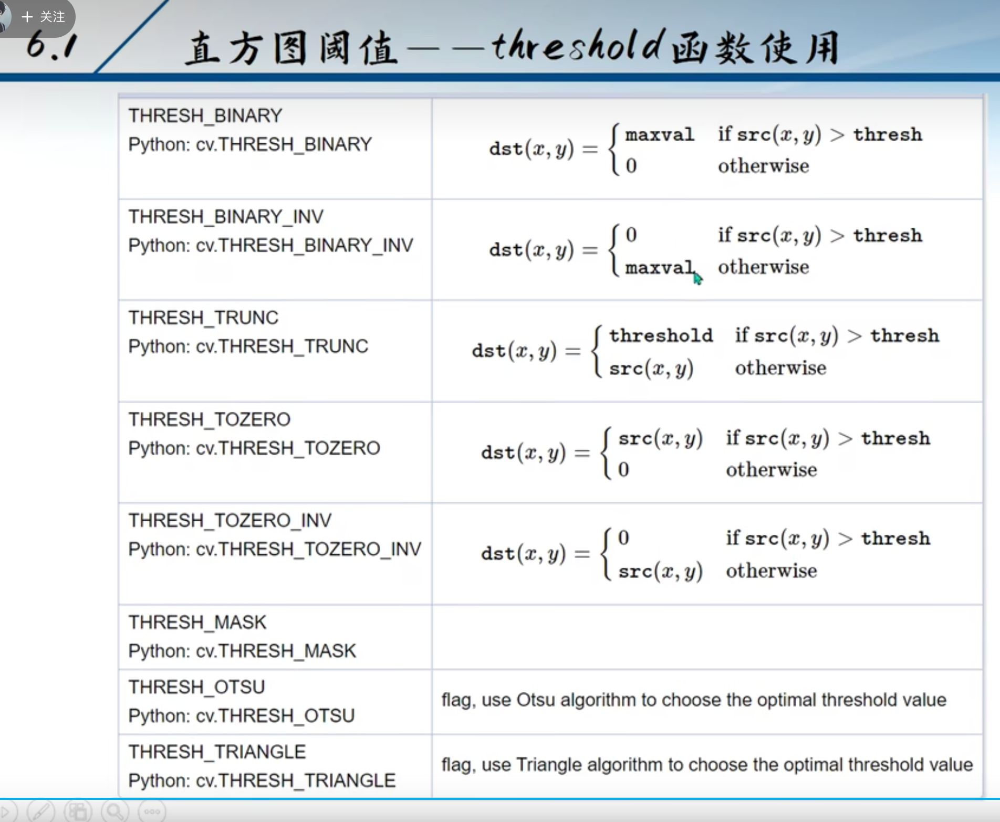

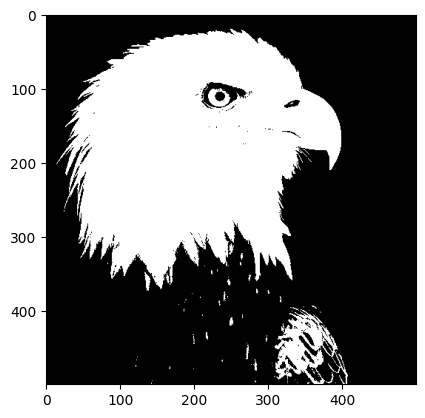

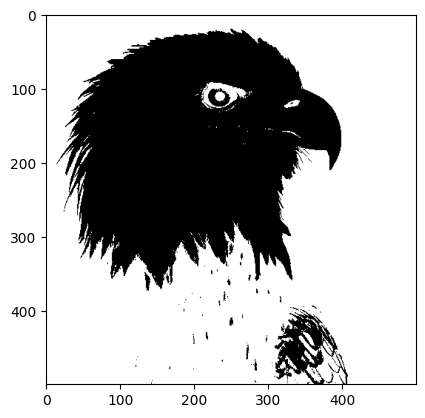

In [7]:
#使用threshold函数对图像二值化
_,img_binary = cv.threshold(img,125,255,cv.THRESH_BINARY)
show(img_binary)
#THRESH_BINARY_INV 对二值化图像取反，即黑变白，白变黑
_,img_binary_inv = cv.threshold(img,125,255,cv.THRESH_BINARY_INV)
show(img_binary_inv)

## 2.三角法阈值
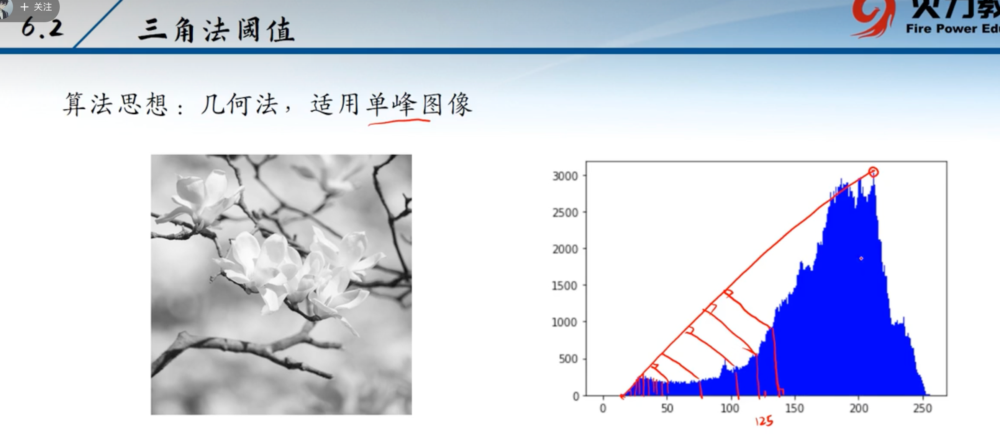

- 原理：先找到灰度直方图中y坐标最大的灰度，以125为界，若>125,则为高灰度，取最低灰度点，二者y坐标相连得一直线，从二者之间的函数值往该直线作垂线，距离最长的灰度为阈值；若<125,则为低阈值，取最高灰度值相连，其他类似。


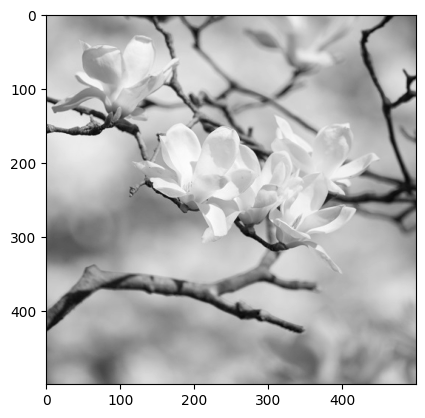

In [8]:
img = cv.imread("pic/blossom500x500.jpg",0)
show(img)


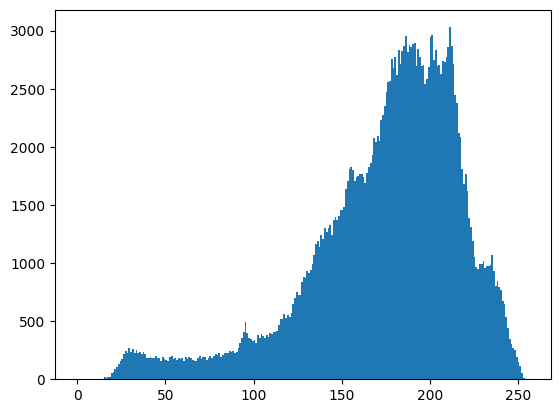

In [9]:
#先二值化
plt.hist(img.ravel(),256,[0,256])
plt.show()

112.0


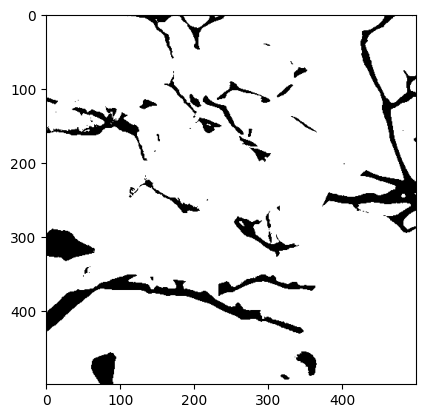

In [10]:
threshold,img_binary = cv.threshold(img,0,255,cv.THRESH_TRIANGLE)#三角法自动计算阈值，所以第二个参数随便取都不要紧，这里取0
print(threshold)
show(img_binary)


## 3.迭代法
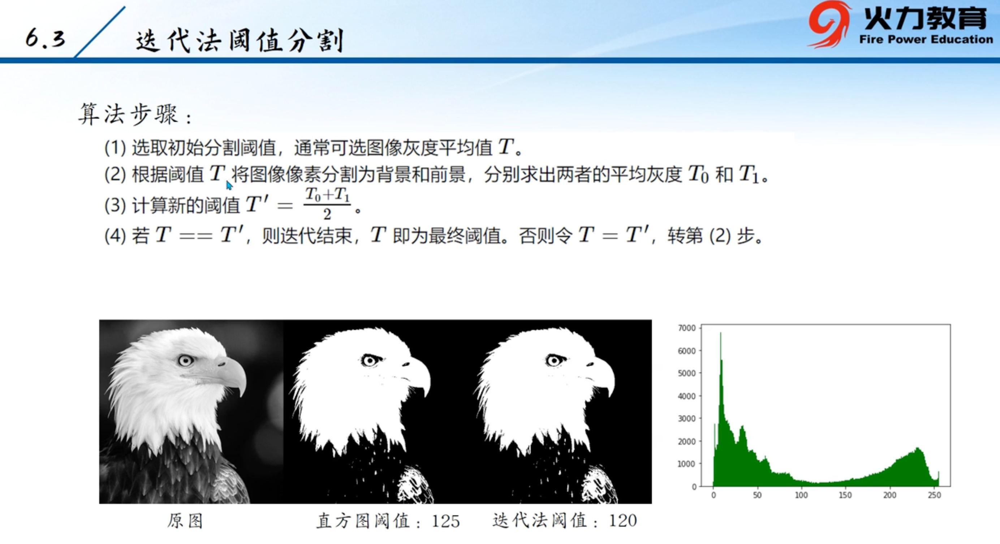

In [5]:
img = cv.imread("pic/eagle500x500.jpg",0)
# show(img)

T = 0
temp = img.mean()
while T != temp:
    T = temp
    # print(T)
    T0 = img[img<T].mean()
    # print(T0)
    T1 = img[img>=T].mean()
    # print(T1)
    temp = (T0+T1)/2
    

print(T)


120.73842746733973


## 4.大津法
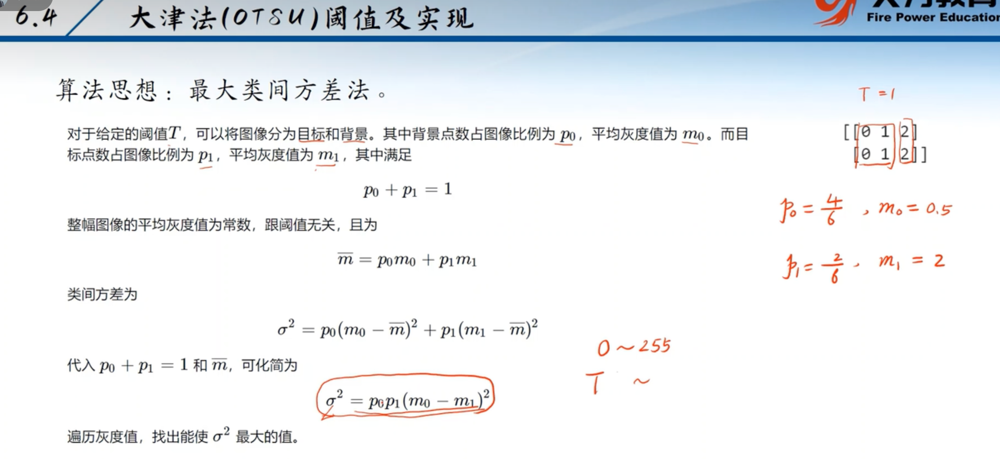

120.0


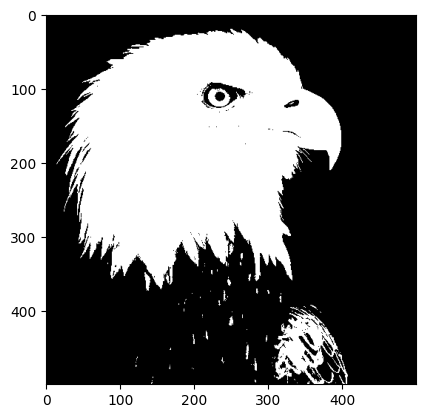

In [7]:
#直接调用函数接口
img = cv.imread("pic/eagle500x500.jpg",0)

th,img_binary = cv.threshold(img,-1,255,cv.THRESH_OTSU)
print(th)
show(img_binary)

In [12]:
#编程实现
img = cv.imread("pic/eagle500x500.jpg",0)

T = -1
sigma=-1

for t in range(0,256):
    bg = img[img<=t] #背景
    prospect = img[img>t] #前景
    
    m0 = bg.mean() if bg.size!=0 else 0
    m1 = prospect.mean() if prospect.size!=0 else 0
    
    p0 = bg.size/img.size
    p1 = prospect.size/img.size
    
    Sigma = p0*p1*((m0-m1)**2)
    
    if sigma<Sigma:
        sigma = Sigma
        T = t
    
print("best thresh:{}".format(T))

    
    

best thresh:120


## 5.自适应阈值
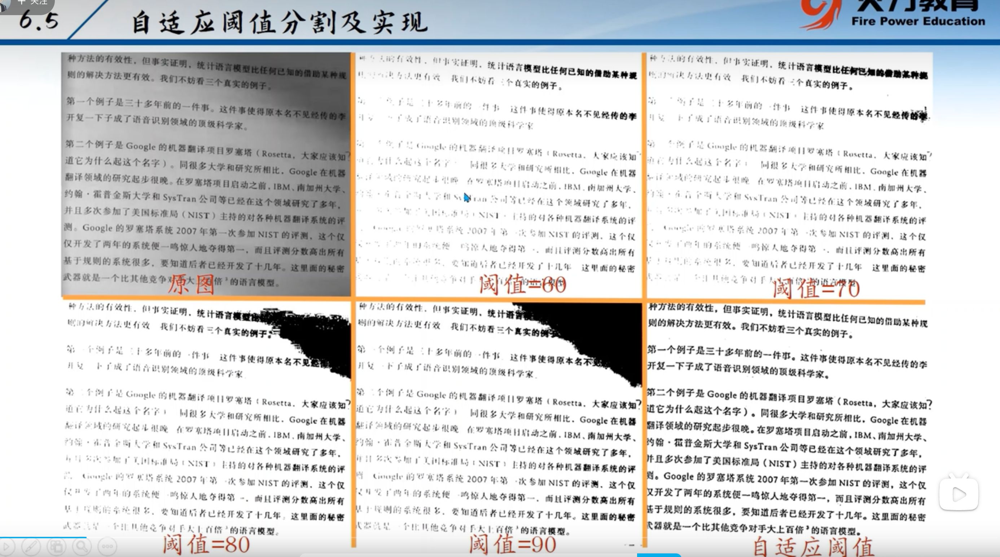
- 原理
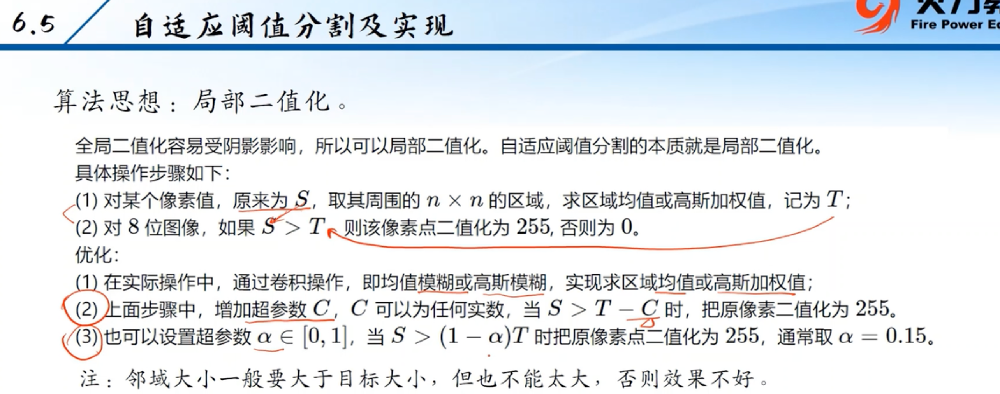

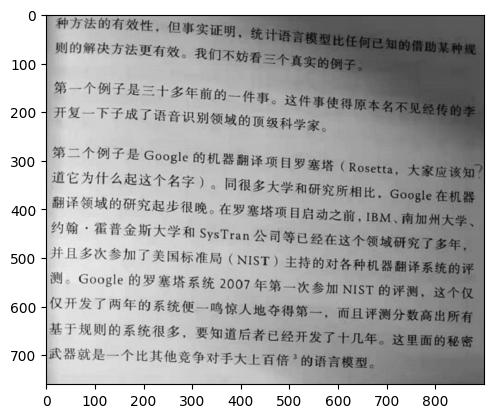

In [13]:
img = cv.imread("pic/page760x900.jpg",0)
show(img)

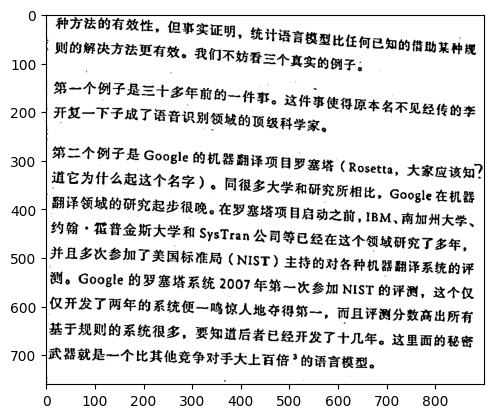

In [14]:
img_binary = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,cv.THRESH_BINARY,21,6)
show(img_binary)

## 6.自适应阈值编程实现

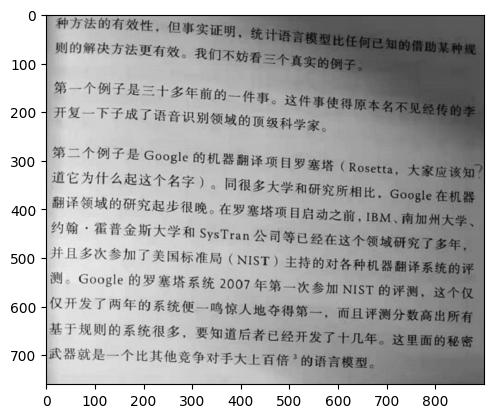

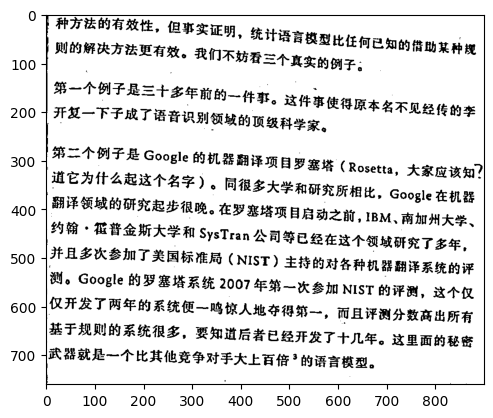

In [19]:
img = cv.imread("pic/page760x900.jpg",0)
show(img)

C = 6
winSize = 21

img_blur = cv.blur(img,(winSize,winSize))

img_binary = np.uint8(img>img_blur-C)*255

show(img_binary)

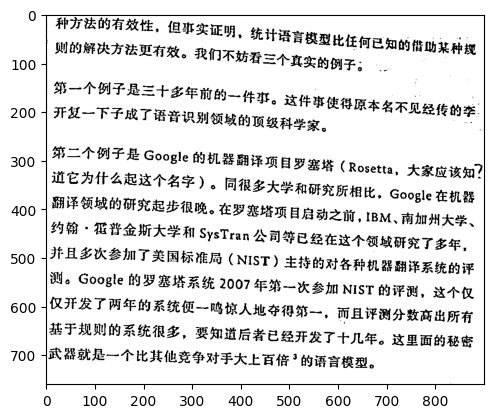

In [20]:
img = cv.imread('pic/page760x900.jpg', 0)

alpha = 0.05
winSize = 21

img_blur = cv.GaussianBlur(img, (winSize, winSize), 5) #这里取的5是根号21
img_bin = np.uint8(img > (1 - alpha) * img_blur) * 255

show(img_bin)